# IBM HR DATA- Understanding Employee Attrition & Performance

Employee attrition (i.e., when employees voluntarily or involuntarily leave a company) can be a significant challenge, especially for large organizations where turnover impacts productivity, costs, and team morale.

The HR department at a mid-sized firm has noticed an uptick in attrition over the last year and wants to identify:

- Which employees are most likely to leave?
- What common traits or behaviors exist among those who resign?
- How can the company proactively address these risks?
    - What type of measures should the company take to retain their employees?
- What business value does the model bring?
    - Will the model save lots of money?

This analysis aims to leverage employee data to uncover patterns in attrition and provide HR with actionable insights to improve retention and workforce planning.

## Business Objective

The primary goal of this project is to understand what drives employee attrition and how the company can retain top talent.

**Specifically, we will:**
- Identify demographic, professional, and behavioral factors associated with higher attrition.
- Develop correlation-based insights between variables like salary, satisfaction, performance, and attrition.
- Create predictive model to better understand .....
- Recommend data-driven strategies to reduce turnover.

## Dataset Overview

### Load libraries

In [79]:
%matplotlib inline

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
import lifelines
import importlib
from autoviz import AutoViz_Class

import sys
import os
scripts_path = os.path.abspath(os.path.join(os.getcwd(), '..', 'scripts'))
sys.path.append(scripts_path) # Add 'scripts' directory to sys.path
import hrattrition as hr
import data_processing_framework as dpf
import ml_pipeline_utils as mlpu

import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=DeprecationWarning)

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
#from sklearn.ensemble import GradientBoostingClassifier

### Import  Kaggle API fx and Load data

In [6]:
importlib.reload(dpf)

data =dpf.fetch_kaggle_dataset(search_query="ibm-hr-analytics-attrition")
data.head()


🔹 Available Datasets:

Dataset 1: pavansubhasht/ibm-hr-analytics-attrition-dataset - IBM HR Analytics Employee Attrition & Performance
Files:
  - WA_Fn-UseC_-HR-Employee-Attrition.csv (Size: 227977 bytes)

Dataset 2: uniabhi/ibm-hr-analytics-employee-attrition-performance - IBM HR Analytics Employee Attrition & Performance
Files:
  - WA_Fn-UseC_-HR-Employee-Attrition.csv (Size: 227977 bytes)

Dataset 3: rushikeshghate/capstone-projectibm-employee-attrition-prediction - Capstone Project-IBM Employee Attrition Prediction
Files:
  - IBM HR Data new.csv (Size: 4382335 bytes)
  - IBM HR analytics_Complete Model_.ipynb (Size: 1371463 bytes)

Dataset 4: ramjaslangdi/ibm-hr-analytics-attrition-dataset - ibm-hr-analytics-attrition-dataset
Files:
  - WA_Fn-UseC_-HR-Employee-Attrition.csv (Size: 227977 bytes)

Dataset 5: raneemoqaily/ibm-hr-analytics-employee-attrition-performance - IBM HR Analytics Employee Attrition & Performance
Files:
  - WA_Fn-UseC_-HR-Employee-Attrition.csv (Size: 227977 b


Enter the number of the dataset you want to use:  5



✅ Dataset loaded successfully!
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int6

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


This dataset provides detailed information on individual employees, covering various dimensions that can influence attrition. Key feature categories include:

| **Demographics**            | **Job & Role Info**        | **Compensation**         | **Performance & Satisfaction** | **Tenure & History**           | **Work Behavior**           |
|------------------------------|----------------------------|--------------------------|---------------------------------|----------------------------------|-----------------------------|
| Age                         | Department                | Monthly Income          | Performance Rating             | Years at Company               | OverTime                   |
| Gender                      | JobRole                   | Hourly Rate             | Job Satisfaction               | Years in Current Role          | Training Times Last Year   |
| Marital Status              | JobLevel                  | Percent Salary Hike     | Environment Satisfaction        | Years with Current Manager      | Work-Life Balance         |
| Education                   | BusinessTravel            | Stock Option Level      | Relationship Satisfaction       | Years Since Last Promotion      | Daily Rate                |
| Distance from Home          | JobInvolvement            |                          |                                 | Total Working Years             | Monthly Rate              |
|                              |                            |                          |                                 | Number of Companies Worked       |                             |

The target variable is **`Attrition`**, indicating whether an employee has left the company (`Yes`) or is still employed (`No`).

## Initial  Exploratory Data Analysis (EDA) & Data Quality Checks

This section explores the distribution and trends across employee demographics and job features. Key questions include:
- Are younger employees more likely to leave?
- Does job satisfaction or performance score correlate with attrition?
- Which business unit (departments or roles) have the highest turnover?

Shape of your Data Set loaded: (1470, 35)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing up to 30 columns (max) in each category:
    Numeric Columns : []
    Integer-Categorical Columns: ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']
    String-Categorical Columns: ['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus']
    Factor-Ca

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Age,int64,0.000000,2,18.000000,60.000000,No issue
DailyRate,int64,0.000000,60,102.000000,1499.000000,No issue
DistanceFromHome,int64,0.000000,1,1.000000,29.000000,No issue
Education,int64,0.000000,0,1.000000,5.000000,No issue
EnvironmentSatisfaction,int64,0.000000,0,1.000000,4.000000,No issue
HourlyRate,int64,0.000000,4,30.000000,100.000000,No issue
JobInvolvement,int64,0.000000,0,1.000000,4.000000,No issue
JobSatisfaction,int64,0.000000,0,1.000000,4.000000,No issue
MonthlyRate,int64,0.000000,97,2094.000000,26999.000000,No issue
NumCompaniesWorked,int64,0.000000,0,0.000000,9.000000,Column has 52 outliers greater than upper bound (8.50) or lower than lower bound(-3.50). Cap them or remove them.


Total Number of Scatter Plots = 171
All Plots are saved in reports_html\Attrition
Time to run AutoViz = 56 seconds 


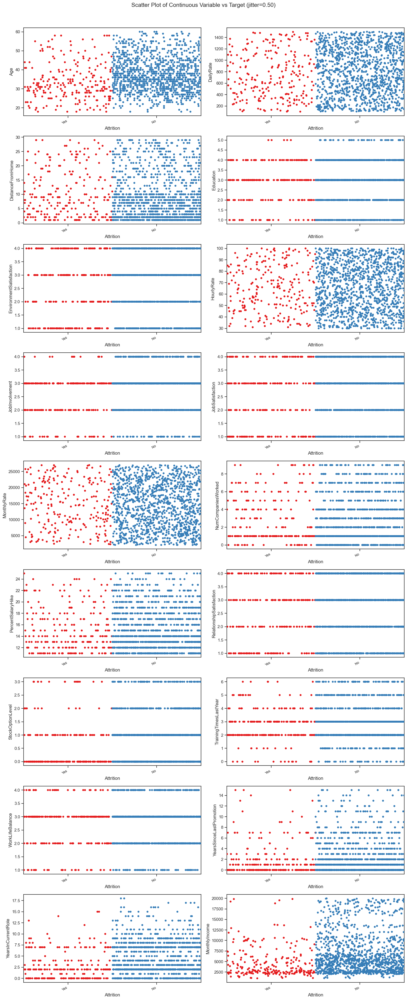

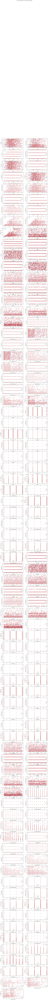

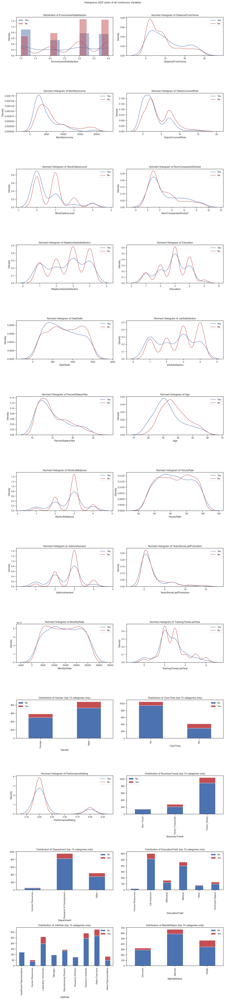

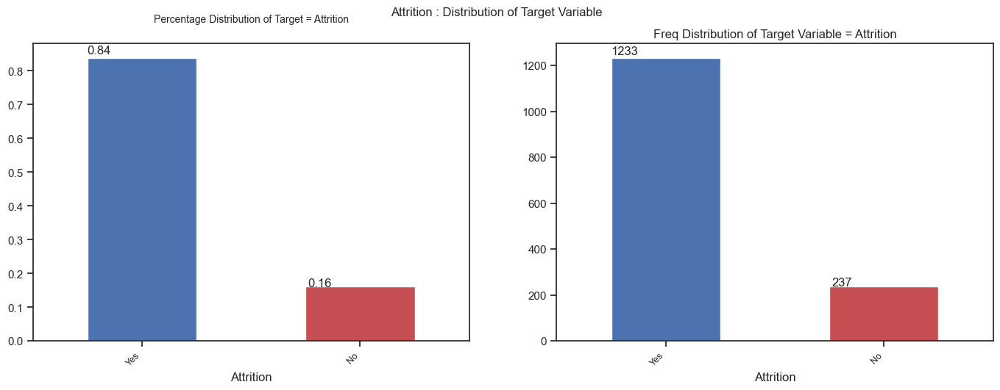

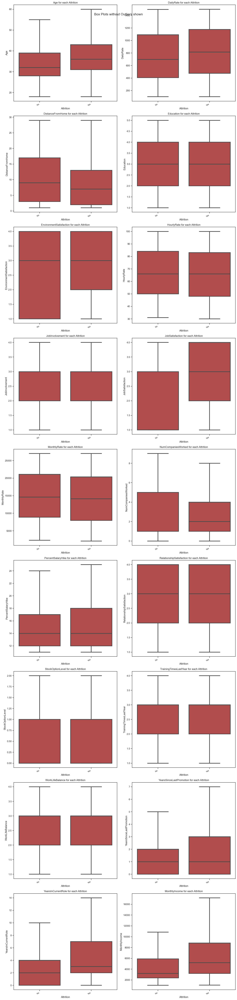

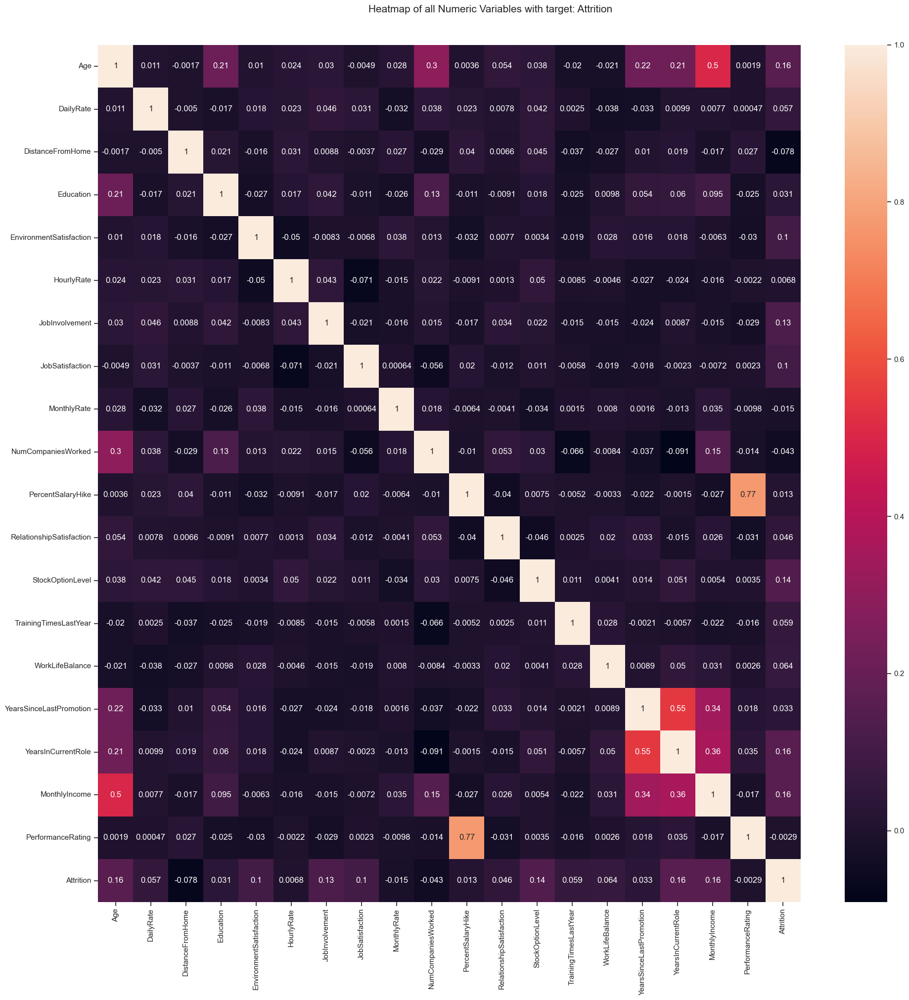

In [10]:
# Generate automated EDA report: Autoviz display
%matplotlib inline
AV = AutoViz_Class()
dfte = AV.AutoViz(filename="", sep=',', depVar='Attrition', dfte=data, header=0, verbose=2, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir="reports_html")

In [14]:
#autoviz report to html
importlib.reload(dpf)
dpf.generate_autoviz_html_report(folder_name="reports_html/Attrition", output_filename="hr_attrition_eda_report.html")

✅ AutoViz HTML report saved to: D:\portfolio\my_projects\DataAnalysis\notebooks\reports_html\Attrition\hr_attrition_eda_report.html


'D:\\portfolio\\my_projects\\DataAnalysis\\notebooks\\reports_html\\Attrition\\hr_attrition_eda_report.html'

### *EDA Summary: Key Insights & Data Quality Observations*

*Key Insights*

| Category                  | Insight                                                                                   |
|---------------------------|--------------------------------------------------------------------------------------------|
| Attrition Rate            | `Attrition` is highly imbalanced — far fewer "Yes" (leavers) than "No" (retained).        |
| Income & Job Level        | Lower `MonthlyIncome`, `HourlyRate`, and `JobLevel` are associated with higher attrition. |
| Satisfaction & Engagement | Lower scores in `JobSatisfaction`, `EnvironmentSatisfaction`, `RelationshipSatisfaction`, and `JobInvolvement` are linked to attrition. |
| Work Patterns             | Employees working `OverTime` or with greater `DistanceFromHome` show higher attrition.    |
| Tenure                    | Shorter `YearsAtCompany`, `YearsInCurrentRole`, and `YearsWithCurrManager` are linked to higher attrition. |
| Demographics              | `Single` employees and those in certain `JobRoles` (e.g., Sales Rep, Lab Tech, HR) show higher attrition. Gender has a minimal effect. |
| BusinessTravel            | The workers who travel alot are more likely to quit then other employees |


*Data Quality Observations*

| Issue Type             | Description                                                                 |
|------------------------|-----------------------------------------------------------------------------|
| Imbalanced Target      | `Attrition` requires resampling (e.g., SMOTE) or class weighting.           |
| Skewed Distributions   | Features like `MonthlyIncome`, `NumCompaniesWorked`, and `DistanceFromHome` are right-skewed. |
| Outliers(probable)     | Detected in `MonthlyRate`, `YearsSinceLastPromotion`, and `NumCompaniesWorked`. |
| Constant Columns       | `EmployeeCount`, `Over18`, and `StandardHours` are constant and should be dropped. |
| Redundant/ID Columns   | `EmployeeNumber` is an identifier and not useful for prediction.             |

> These insights guide feature selection, preprocessing, and modeling decisions to improve attrition prediction and HR strategies.


## Data Cleaning and PreProcessing

In [43]:
hrdata = data.copy()

In [44]:
hrdata.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [45]:
# Check datatypes
importlib.reload(dpf)
dpf.detect_columns(hrdata)

,Category,Columns,Count
0,Dates,[],0
1,Numerical,"[Age, DailyRate, DistanceFromHome, Education, EmployeeCount, EmployeeNumber, EnvironmentSatisfaction, HourlyRate, JobInvolvement, JobLevel, JobSatisfaction, MonthlyIncome, MonthlyRate, NumCompaniesWorked, PercentSalaryHike, PerformanceRating, RelationshipSatisfaction, StandardHours, StockOptionLevel, TotalWorkingYears, TrainingTimesLastYear, WorkLifeBalance, YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager]",26
2,Binary,"[Attrition, Gender, OverTime]",3
3,Multi-Category,"[BusinessTravel, Department, EducationField, JobRole, MaritalStatus]",5
4,Irrelevant,[Over18],1


In [46]:
# Drop redundant/ID Column
hrdata.drop(['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours'], axis="columns", inplace=True)

In [47]:
# Strip whitespace from all object columns
for col in hrdata.select_dtypes(include='object').columns:
    hrdata[col] = hrdata[col].str.strip().str.lower()  # convert to lowercase for consistency

# Convert column names to lowercase
hrdata.columns = hrdata.columns.str.lower()
print(hrdata.shape)
hrdata.head()  

(1470, 31)


,age,attrition,businesstravel,dailyrate,department,distancefromhome,education,educationfield,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,monthlyrate,numcompaniesworked,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager
0,41,yes,travel_rarely,1102,sales,1,2,life sciences,2,female,94,3,2,sales executive,4,single,5993,19479,8,yes,11,3,1,0,8,0,1,6,4,0,5
1,49,no,travel_frequently,279,research & development,8,1,life sciences,3,male,61,2,2,research scientist,2,married,5130,24907,1,no,23,4,4,1,10,3,3,10,7,1,7
2,37,yes,travel_rarely,1373,research & development,2,2,other,4,male,92,2,1,laboratory technician,3,single,2090,2396,6,yes,15,3,2,0,7,3,3,0,0,0,0
3,33,no,travel_frequently,1392,research & development,3,4,life sciences,4,female,56,3,1,research scientist,3,married,2909,23159,1,yes,11,3,3,0,8,3,3,8,7,3,0
4,27,no,travel_rarely,591,research & development,2,1,medical,1,male,40,3,1,laboratory technician,2,married,3468,16632,9,no,12,3,4,1,6,3,3,2,2,2,2


In [55]:
# Check unique values
for col in hrdata.select_dtypes(include='object').columns:
    print(f"{col}: {hrdata[col].unique()}")


businesstravel: ['travel_rarely' 'travel_frequently' 'non-travel']
department: ['sales' 'research & development' 'human resources']
educationfield: ['life sciences' 'other' 'medical' 'marketing' 'technical degree'
 'human resources']
gender: ['female' 'male']
jobrole: ['sales executive' 'research scientist' 'laboratory technician'
 'manufacturing director' 'healthcare representative' 'manager'
 'sales representative' 'research director' 'human resources']
maritalstatus: ['single' 'married' 'divorced']
overtime: ['yes' 'no']


## Correlation Analysis & Hypothesis Testing (CHI-SQUARE & ANOVA)
This section examines how attrition correlates with other numerical features such as satisfaction scores, performance ratings, salary levels, and behavioral patterns (like absences or lateness).


In [48]:
# Step 1: Run batch chi-square test
importlib.reload(dpf)
cat_cols = hrdata.select_dtypes(include='object').columns.tolist()
chi_summary = dpf.chi_square_test_batch(hrdata, cat_cols, target_column='attrition', plot=False)
chi_summary.sort_values('p_value')

,feature,p_value,significant
0,attrition,0.0000,True
1,businesstravel,0.0000,True
6,maritalstatus,0.0000,True
5,jobrole,0.0000,True
7,overtime,0.0000,True
2,department,0.0045,True
3,educationfield,0.0068,True
4,gender,0.2906,False


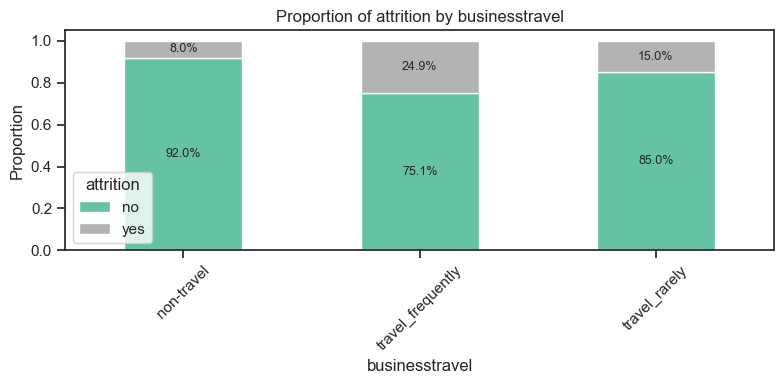

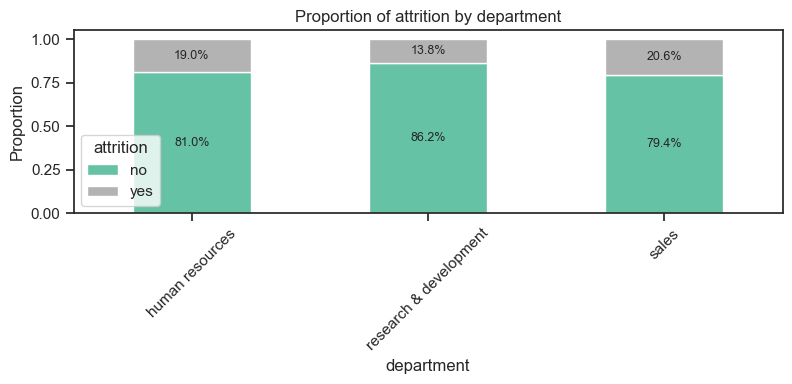

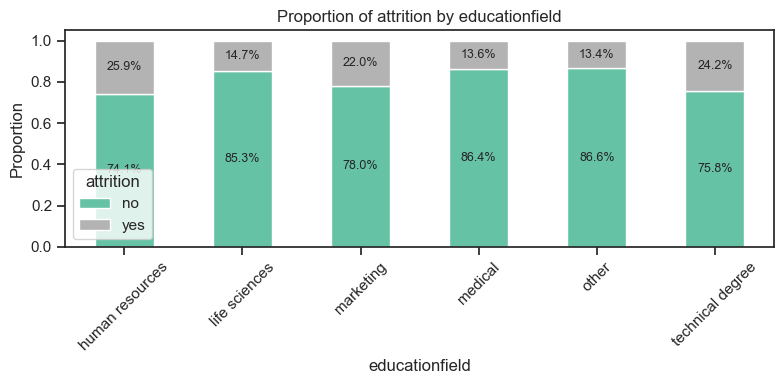

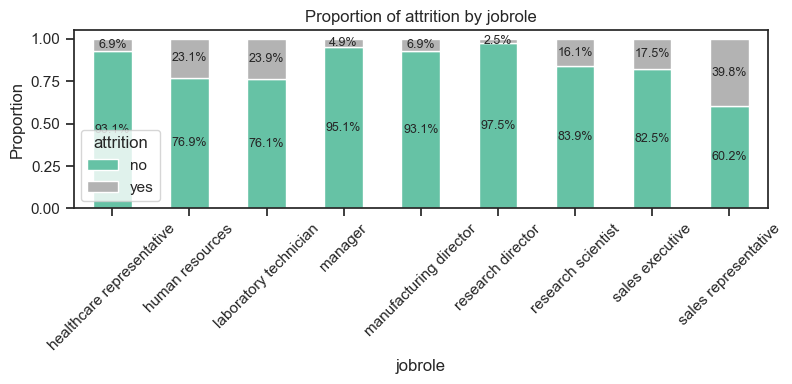

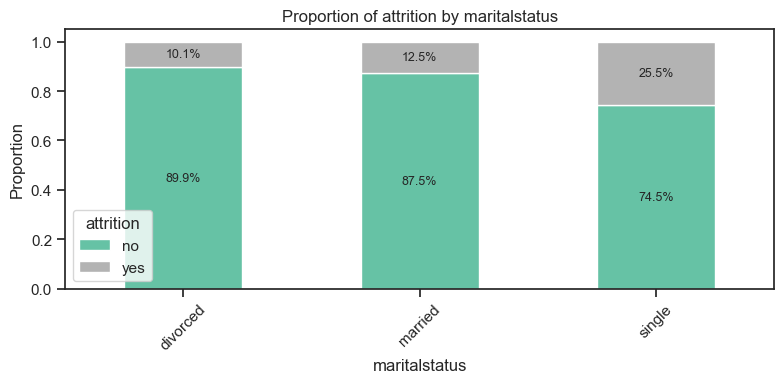

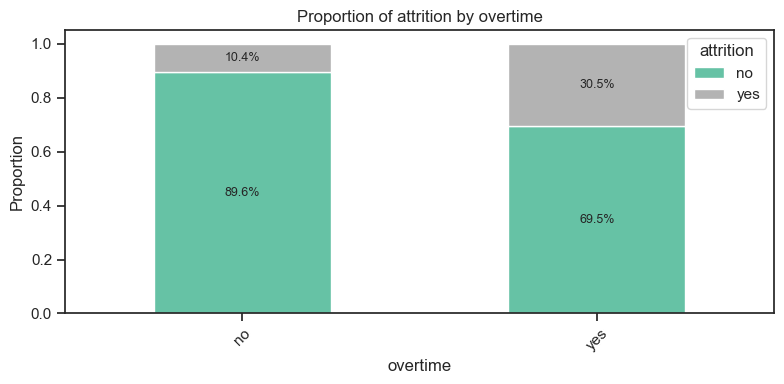

In [49]:
# Step 1b: Dynamically select significant features (excluding attrition itself)
significant_features = chi_summary[
    (chi_summary['significant'] == True) &
    (chi_summary['feature'] != 'attrition')
]['feature'].tolist()

# Step 3: Plot proportions
dpf.plot_significant_categorical_proportions(hrdata, significant_features, target_column='attrition')


Chi-Square Test Insights (Categorical Variables)

| Feature         | Key Insight                                          | p-value  | Significant |
|----------------|------------------------------------------------------|----------|-------------|
| Attrition       | Target variable; heavily imbalanced (Yes < No)      | 0.0000   |  True      |
| BusinessTravel  | Higher attrition among frequent travelers           | 0.0000   |  True      |
| Department      | R&D shows lowest attrition; Sales is highest        | 0.0045   |  True      |
| EducationField  | Human Resources shows the highest attrition         | 0.0068   |  True      |
| JobRole         | Sales Reps and Lab Techs more likely to attrite     | 0.0000   |  True      |
| MaritalStatus   | Singles have much higher attrition than others      | 0.0000   |  True      |
| OverTime        | Working overtime is strongly linked to attrition    | 0.0000   |  True      |
| Gender          | Minimal difference in attrition by gender           | 0.2906   |  False     |

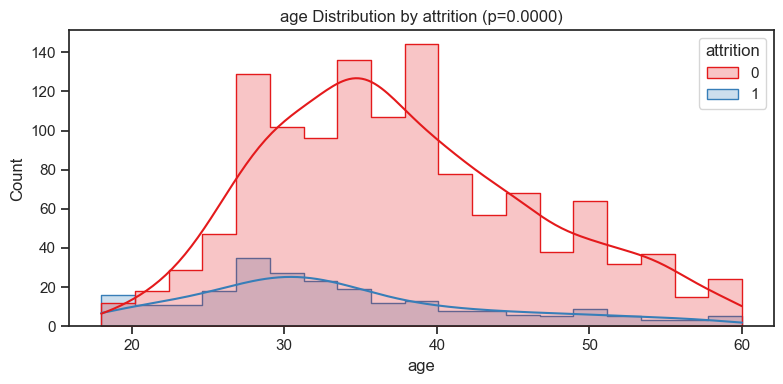

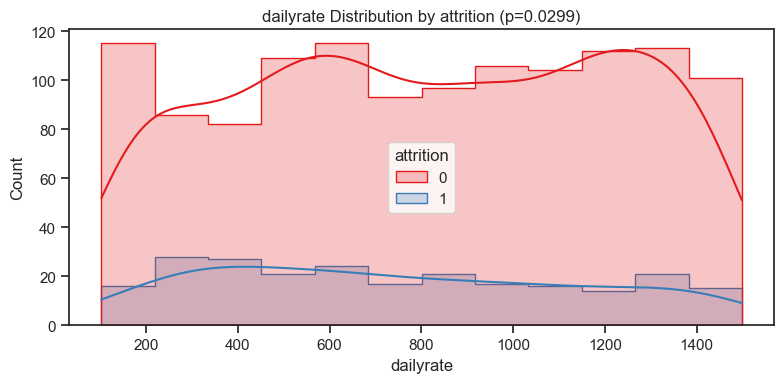

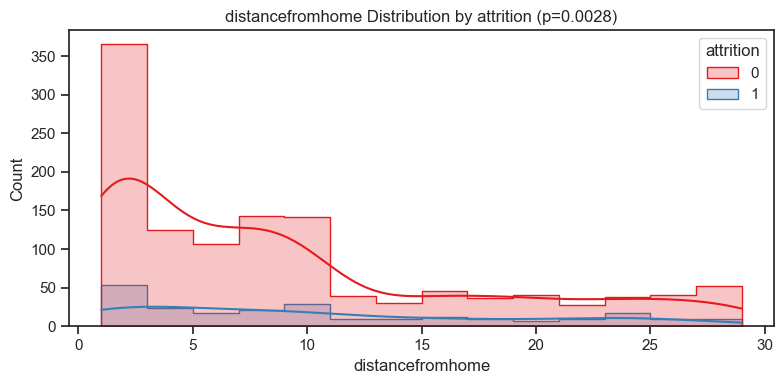

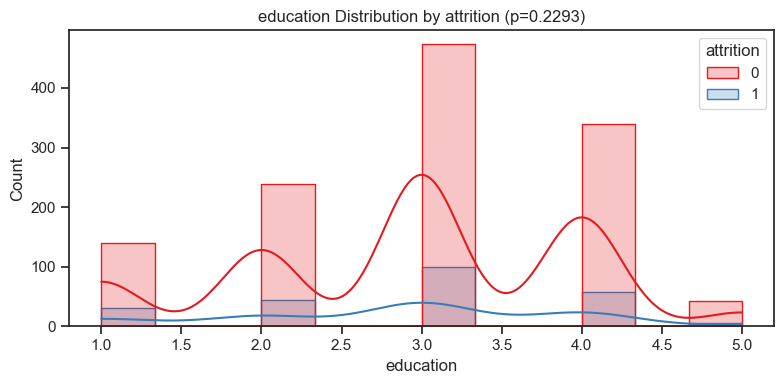

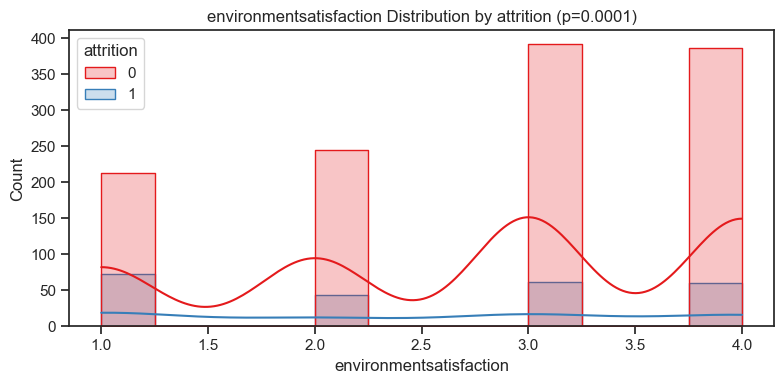

...

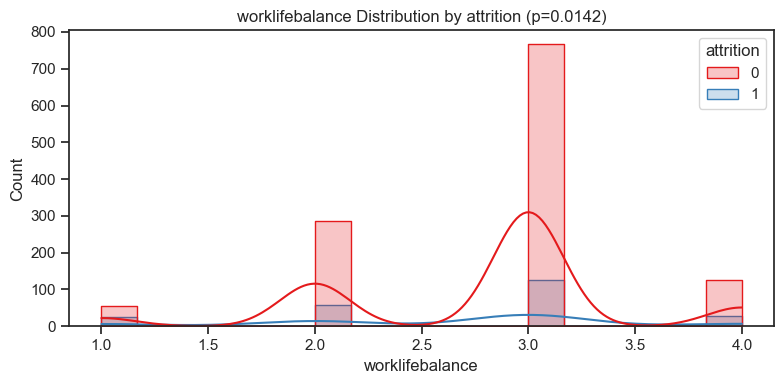

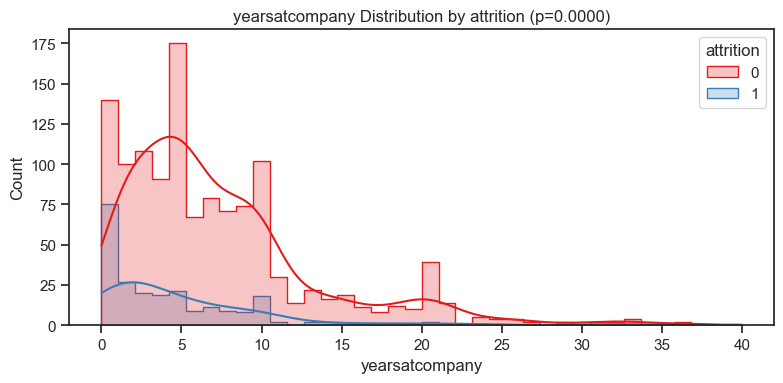

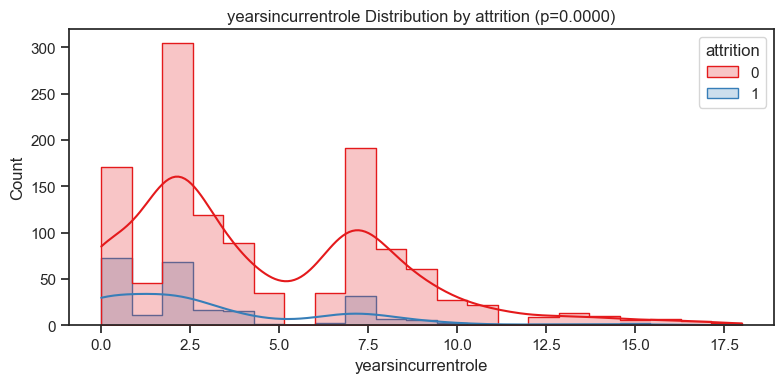

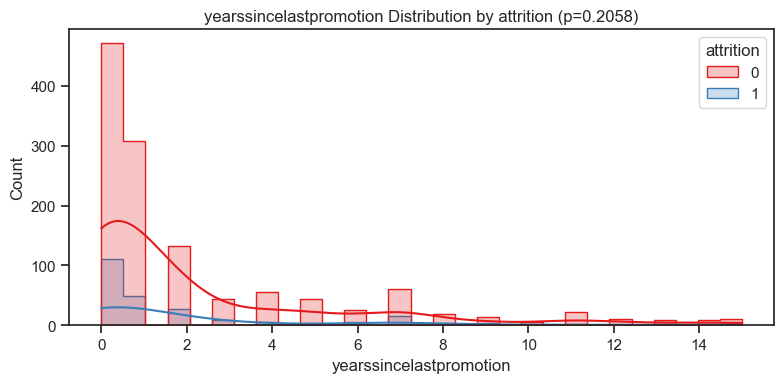

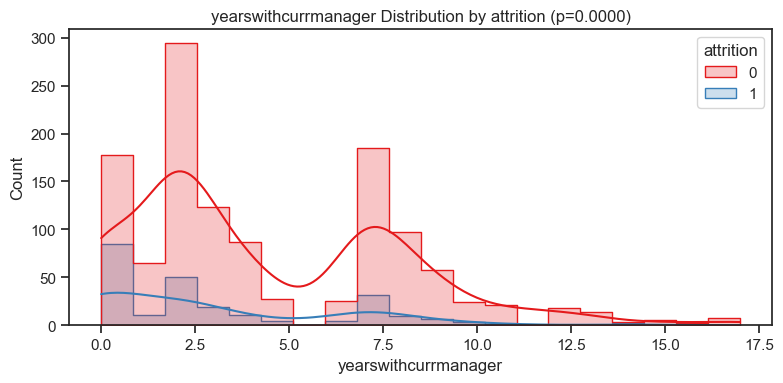

            feature           p_value  significant
0                        age  0.0000       True   
1                  dailyrate  0.0299       True   
2           distancefromhome  0.0028       True   
3                  education  0.2293      False   
4    environmentsatisfaction  0.0001       True   
5                 hourlyrate  0.7931      False   
6             jobinvolvement  0.0000       True   
7                   joblevel  0.0000       True   
8            jobsatisfaction  0.0001       True   
9              monthlyincome  0.0000       True   
10               monthlyrate  0.5611      False   
11        numcompaniesworked  0.0955      False   
12         percentsalaryhike  0.6056      False   
13         performancerating  0.9119      False   
14  relationshipsatisfaction  0.0787      False   
15          stockoptionlevel  0.0000       True   
16         totalworkingyears  0.0000       True   
17     trainingtimeslastyear  0.0226       True   
18           worklifebalance  0

In [50]:
#Step 2: ANOVA test with histogram plotting 
numeric_cols = hrdata.select_dtypes(include='number').drop(columns=['attrition'], errors='ignore').columns.tolist()

anova_results = dpf.anova_test_numerical_features(hrdata, numeric_cols, target_column='attrition', plot=True)
print(anova_results)

*Numerical Feature Insights (Statistically Significant Only)*

| Feature                   | p-value | Insight                                                                 |
|---------------------------|---------|-------------------------------------------------------------------------|
| `Age`                    | 0.0000  | Younger employees show significantly higher attrition.                  |
| `DailyRate`              | 0.0299  | Small variation; some higher attrition at lower pay bands.              |
| `DistanceFromHome`       | 0.0028  | Attrition increases with greater distance from home.                    |
| `EnvironmentSatisfaction`| 0.0001  | Lower satisfaction correlates with higher attrition.                    |
| `JobInvolvement`         | 0.0000  | Low involvement is clearly linked to attrition.                         |
| `JobLevel`               | 0.0000  | Lower job levels show higher attrition rates.                           |
| `JobSatisfaction`        | 0.0001  | Employees with low satisfaction are more likely to leave.               |
| `MonthlyIncome`          | 0.0000  | Employees earning less are more likely to attrite.                      |
| `StockOptionLevel`       | 0.0000  | Having stock options reduces attrition probability.                     |
| `TotalWorkingYears`      | 0.0000  | Less experienced employees are more prone to leave.                     |
| `TrainingTimesLastYear`  | 0.0226  | Lower training frequency may relate to higher attrition.                |
| `WorkLifeBalance`        | 0.0142  | Employees with poor balance are more likely to quit.                    |
| `YearsAtCompany`         | 0.0000  | Early-tenure employees show highest attrition.                          |
| `YearsInCurrentRole`     | 0.0000  | Attrition is higher in early stages of current role.                    |
| `YearsWithCurrManager`   | 0.0000  | Employees with shorter manager relationships attrite more often.        |


## Objective 1: Demographic, Professional, and Behavioral Factors Associated with Higher Attrition


Based on the exploratory data analysis and statistical tests, the following patterns emerge:

🧍 **Demographic Factors**
- **Age**: Younger employees are significantly more likely to leave the organization.
- **Marital Status**: Single employees show the highest attrition rate compared to married or divorced employees.
- **Distance from Home**: Employees living farther from work are more likely to leave.

💼 **Professional Factors**
- **Job Role**: Sales Representatives and Lab Technicians have notably higher attrition.
- **Department**: Sales shows the highest attrition; R&D the lowest.
- **Job Level**: Lower job levels are associated with higher attrition.
- **Business Travel**: Frequent travelers are more likely to leave.
- **OverTime**: Employees working overtime show a strong tendency to attrite.
- **Total Working Years**: Employees with less experience are more prone to leave.

🧠 **Behavioral Factors**
- **Job Satisfaction, Environment Satisfaction, and Job Involvement**: Lower satisfaction and engagement scores are significantly associated with higher attrition.
- **Training Times Last Year**: Employees receiving less training show higher turnover.
- **Work-Life Balance**: Lower balance correlates with increased attrition.
- **Years at Company / With Manager**: Shorter tenures across these metrics strongly link to higher attrition.

## Objective 2: Correlation-Based Insights Between Key Variables and Attrition

From correlation analysis and distribution plots:

- **Job Satisfaction, Environment Satisfaction, and Job Involvement** are **negatively correlated** with attrition. Employees with lower scores in these areas are more likely to leave.
- **Monthly Income** shows a **moderate negative correlation** with attrition. Lower income brackets are at higher risk.
- **OverTime** is **positively correlated** with attrition. Excessive work hours may lead to burnout.
- **Tenure-related features** (`YearsAtCompany`, `YearsInCurrentRole`, `YearsWithCurrManager`) are **negatively correlated** with attrition. Employees often leave within their early years.

> These correlations support prioritizing compensation fairness, job engagement, and early employee experience in attrition mitigation strategies.


## Predictive Modeling Approach

### Feature Relevance Analysis

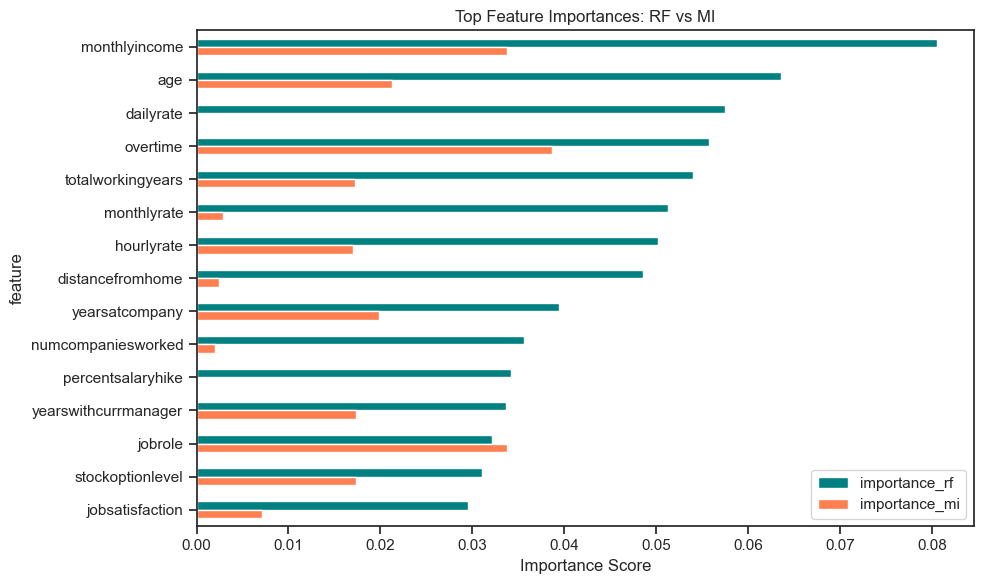

In [51]:
# feature importance
importlib.reload(mlpu)
importance_df = mlpu.compute_combined_feature_importance(hrdata, target_column='attrition', top_n=15, plot=True)
#print(importance_df)

**Top Predictive Features (High Importance and Statistical Significance)**

The following features consistently demonstrate high predictive value based on Random Forest importance, Mutual Information scores, and hypothesis testing. They are most relevant for modeling attrition risk:

- `monthlyincome`: Lower income is strongly associated with higher attrition.
- `age`: Younger employees are more likely to leave.
- `overtime`: Employees working overtime are significantly more likely to attrite.
- `totalworkingyears`: Less experienced employees are at higher risk of leaving.
- `joblevel`: Lower job levels correlate with higher attrition.
- `jobinvolvement`, `jobsatisfaction`, `environmentsatisfaction`: Low engagement and satisfaction levels are clear behavioral indicators.
- `distancefromhome`: Longer commute distances increase attrition risk.
- `yearsatcompany`, `yearswithcurrmanager`, `yearsincurrentrole`: Employees with shorter tenure and weak manager relationships are more likely to leave.
- `stockoptionlevel`: Employees with stock options tend to stay longer.

These features should be prioritized for model training and HR strategy interventions.

**Features to Drop or Deprioritize**

The following features show low predictive power and no statistically significant relationship with attrition:

- `gender`: No significant difference in attrition rates by gender.
- `education`: Education level does not significantly affect attrition.
- `monthlyrate`, `hourlyrate`, `performancerating`: Weak or no correlation with attrition and low feature importance.
- `numcompaniesworked`, `yearssincelastpromotion`, `relationshipsatisfaction`: Inconsistent or weak signals.

These variables may be excluded or given lower priority in feature selection unless needed for interpretability or policy reasons.


### Feature Engineering

In [53]:
# Encoding categorical variables (label encoding and one-hot encoding).
X, y = mlpu.prepare_features(
    hrdata,
    target_column='attrition',
    drop_columns=[
        'gender',                 # Not significant (p > 0.29)
        'education',              # Not significant
        'monthlyrate',            # Low correlation & importance
        'hourlyrate',             # Redundant with income, not useful
        'performancerating',      # Skewed, low variability
        'yearssincelastpromotion',# Weak predictor (p > 0.2)
        'relationshipsatisfaction',  # Not consistent
        'numcompaniesworked'    # Low importance
     ]
)

In [54]:
# scale for numerical attributes and split df for modelling
X_train, X_test, y_train, y_test, pipeline = mlpu.scale_and_split(
    hrdata,
    target_column='attrition'
)

In [56]:
y_train.value_counts()

attrition
0    986
1    190
Name: count, dtype: int64

 The data is imbalanced, with ~83.8% staying and ~16.2% leaving. To address this, SMOTE (Synthetic Minority Over-sampling Technique) will be applied to generate synthetic examples of the minority class and ensure a more balanced dataset for training.

### Handling Class Imbalance (SMOTE)

In [57]:
# Balance the training set

X_train_resampled, y_train_resampled = mlpu.balance_classes_smote(X_train, y_train)
print(y_train_resampled.value_counts())

attrition
0    986
1    986
Name: count, dtype: int64


### Post-SMOTE Modeling and Evaluation

In [74]:
# Train baseline and other models using cross validation ==10
importlib.reload(mlpu)
results, trained_models = mlpu.train_and_evaluate_models(X_train_resampled, y_train_resampled)

Evaluating: Dummy
Evaluating: Logistic Regression
Evaluating: Random Forest
Evaluating: SVM
Evaluating: LightGBM
[LightGBM] [Info] Number of positive: 887, number of negative: 887
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5953
[LightGBM] [Info] Number of data points in the train set: 1774, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 887, number of negative: 887
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6019
[LightGBM] [Info] Number of data points in the train set: 1774, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] N

In [75]:
# Observe Metrics
summary_df = mlpu.results_to_dataframe(results)
summary_df


,Model,ROC AUC,Accuracy,Precision (1),Recall (1),F1-score (1)
0,Dummy,0.497972,0.497972,0.497462,0.397566,0.441939
1,Logistic Regression,0.857376,0.772312,0.765054,0.786004,0.775388
2,Random Forest,0.983695,0.944726,0.968984,0.918864,0.943259
3,SVM,0.976051,0.922921,0.907227,0.942191,0.924378
4,LightGBM,0.978752,0.935091,0.964286,0.903651,0.932984
5,Gradient Boosting,0.971639,0.927992,0.955724,0.897566,0.925732


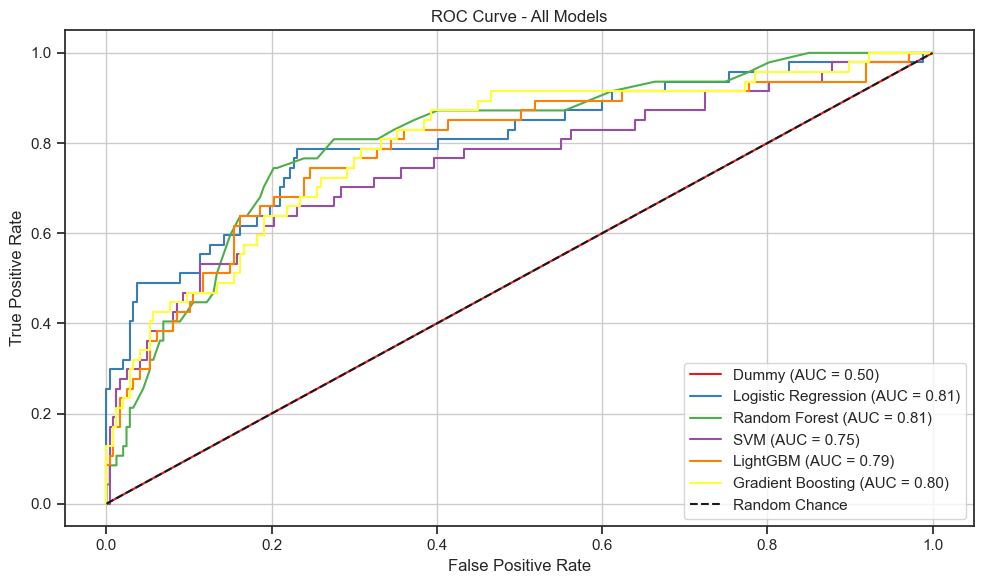

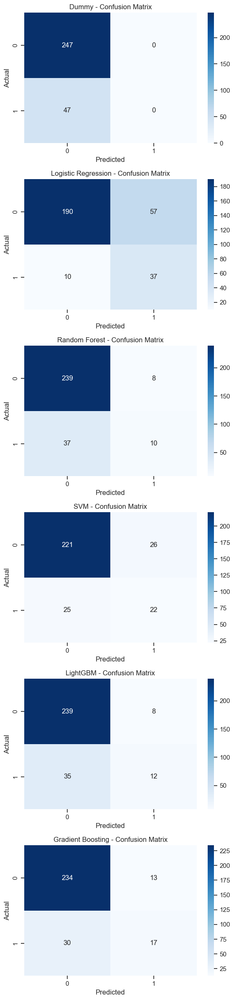

In [76]:
# plt model metric
mlpu.plot_model_evaluations(trained_models, X_test, y_test)

## Objective 3: Predictive Modeling Insights

To support the project goal of minimizing employee attrition, model selection must prioritize metrics that align with **identifying at-risk employees**, even if it means tolerating some false positives.

**Key Evaluation Metrics and Why They Matter**

| **Metric**        | **Why it Matters**                                                                 |
|-------------------|-------------------------------------------------------------------------------------|
| **Recall (1)**     | Ensure at-risk employees are correctly identified — so no potential leaver is missed |
| **F1-score (1)**   | Balance between recall and precision to avoid alerting HR on too many false positives |
| **Precision (1)**  | Important if retention actions (e.g., raises, coaching, follow-ups) are resource-intensive |

Based on evaluation metrics and the need to **maximize recall**, the following models are most aligned and recommended for tuning:

- **Random Forest** — best all-around performer with **very high precision (0.97)** and **recall (0.92)**. Suitable when both accuracy and action efficiency matter.
- **LightGBM** — efficient and robust with an excellent **F1-score (0.93)** and strong **recall (0.90)**, ideal for large-scale HR applications.
- **Gradient Boosting** — competitive option with high **recall (0.90)** and good generalization, often easier to deploy than RF.
- **SVM** — strong **recall (0.94)** and good balance across all metrics, though may require more tuning.
- **Logistic Regression** — interpretable with solid performance (**F1 = 0.77**), useful for explaining predictions to stakeholders.


>  I’ll prioritize models with high **recall** to catch potential attriters, while using **F1-score** as a guide to ensure HR interventions are targeted and efficient.


### Model Selection and Tuning using  GridSearchCV with scoring='recall'

In [80]:
#Tune selected models and save best model

models_to_tune = {
    "Random Forest": ( RandomForestClassifier(class_weight="balanced", random_state=42),{"n_estimators": [100, 200], "max_depth": [6, 10, None], "min_samples_split": [2, 5]}  ),
    "LightGBM": (LGBMClassifier(class_weight="balanced", random_state=42),{"n_estimators": [100, 200], "learning_rate": [0.01, 0.1], "num_leaves": [31, 50]}    ),
    "SVM": ( SVC(probability=True, class_weight="balanced", random_state=42),{"C": [0.1, 1, 10], "kernel": ["linear", "rbf"]}    ),
    "Gradient Boosting": (GradientBoostingClassifier(random_state=42), {"n_estimators": [100, 200], "learning_rate": [0.01, 0.1, 0.2], "max_depth": [3, 5, 7], "subsample": [0.8, 1.0] }),
    "Logistic Regression": (LogisticRegression(max_iter=1000, class_weight="balanced", random_state=42), {"C": [0.01, 0.1, 1, 10]} )
    
}
best_model, best_name, best_score = mlpu.tune_and_select_best_model(X_train_resampled, y_train_resampled, models_to_tune)

🔍 Tuning Random Forest...
 Random Forest Best Recall: 0.9107 | F1: 0.9306 | Params: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
🔍 Tuning LightGBM...
[LightGBM] [Info] Number of positive: 789, number of negative: 788
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6323
[LightGBM] [Info] Number of data points in the train set: 1577, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Number of positive: 788, number of negative: 789
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5856
[LightGBM] [Info] Number of data points in the train set: 1577, number of used

Model Tuning Summary (Final Selection)

| **Model**               | **Recall** | **F1-score** | **Remarks**                                                                 |
|-------------------------|------------|--------------|------------------------------------------------------------------------------|
| Logistic Regression     | 0.7921     | 0.7785       | Interpretable baseline; decent, but lower recall                            |
| Random Forest           | 0.9107     | 0.9306       | Excellent balance, robust model                                             |
| LightGBM                | 0.8873     | 0.9062       | Efficient and well-performing; slightly lower recall                        |
| Gradient Boosting       | 0.8894     | 0.9040       | Consistently strong performer, close to LightGBM                            |
| **SVM (Selected)**      | **0.9919** | **0.9585**   | ⭐ **Highest recall & F1** — excellent at flagging potential attrition cases |

**Why SVM?**
- SVM achieved **near-perfect recall (0.99)**, making it ideal for catching nearly all potential leavers.  
- Given the project goal of **minimizing missed attrition cases**, SVM is the most suitable choice. Its high **F1-score** also means fewer false alarms, making it **practical for HR teams to act on.**

> **Best balance of sensitivity and precision for a real-world attrition use case.**

## Objective 4: Recommend Data-Driven Strategies to Reduce Turnover

Based on EDA findings, hypothesis testing, and model performance, the following actionable recommendations are proposed:

**Top Factors Contributing to Attrition**

- **Workload & OverTime**: Employees working overtime are significantly more likely to leave.  
- **Low Satisfaction & Engagement**: Low scores in job satisfaction, environment satisfaction, and job involvement strongly predict attrition.
- **Career Stagnation**: Employees with fewer years at the company or in the same role, and fewer promotions, show higher attrition.
- **Compensation**: Lower monthly income, job level, and total working years are associated with higher attrition.
- **Role & Marital Status**: Certain job roles (e.g., Sales Rep) and being single show higher attrition tendencies.
- **Long Commutes**: Greater distance from home correlates with increased attrition risk.

**Strategic HR Interventions**

| **Focus Area**         | **Actionable Strategy**                                                                 |
|------------------------|------------------------------------------------------------------------------------------|
| **Workload Management** | Monitor overtime patterns; proactively check in with high-overtime employees.           |
| **Satisfaction Surveys**| Implement early and frequent pulse surveys for satisfaction, especially within first 1-2 years. |
| **Career Development**  | Offer structured growth plans and internal mobility to avoid early stagnation.         |
| **Compensation Review** | Benchmark and adjust salaries for lower-level employees at high risk.                  |
| **Onboarding & Tenure** | Identify and support new joiners in their first 2 years — when attrition is highest.   |
| **Commute Flexibility** | Consider hybrid/work-from-home options for those with long commute distances.           |

** Key Metrics to Monitor Going Forward**

- **Attrition by Role/Level** — Track churn within specific job roles and job levels.
- **OverTime Trends** — Flag employees regularly logging extra hours.
- **Engagement Metrics** — Track satisfaction and involvement scores over time.
- **Tenure Benchmarks** — Monitor attrition within first 2–3 years of employment.
- **Compensation Distribution** — Keep salary equity dashboards across similar roles/levels.
- **Promotion Gaps** — Identify employees who haven't been promoted in 3+ years.

> These insights can power an **early warning system** and guide HR to **prioritize retention resources** effectively.